<h2>IoT-Based Water Supply Management System</h2>
<p>Design an IoT-Based Water Supply Management System to optimize water distribution and consumption in urban and rural settings. This software solution should enable real-time monitoring and management of water supply networks, utilizing IoT sensors to collect data on water flow, pressure, quality, and consumption patterns. The system must feature a user-friendly interface that displays critical metrics and visualizations through interactive dashboards, allowing water utility managers to track system performance and identify leaks or inefficiencies. Additionally, the platform should incorporate predictive analytics to forecast water demand based on historical data and seasonal trends, enabling proactive resource allocation and maintenance scheduling. The challenge is to develop robust algorithms for data analysis and integrate communication protocols that ensure seamless connectivity among all IoT devices. By providing actionable insights and improving operational efficiency, this solution will promote sustainable water management practices, enhance service delivery, and contribute to conservation efforts in the face of growing water scarcity.</p>

In [1]:
#import the necessary modules

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
#Loading the Dataset
df = pd.read_csv("water_supply_dataset.csv")
df.head()

,Timestamp,Sensor_ID,Water_Flow_Rate,Water_Pressure,Water_Temperature,Water_Quality,Water_Level,Leak_Detection,Valve_Status,Pump_Status,Power_Consumption,Region_ID,Demand_Prediction,Maintenance_Status,Daily_Usage,Pressure_Drop,Pipe_Age,Alert_Status,Predicted_Leak,Season
0,2024-10-18 08:06:24.179489,1936,123.012581,458742.877621,11.436859,8,2.629399,1,closed,inactive,4.670474,60,7546.177642,No,6855.607313,2244.574084,88,1,1,Fall
1,2024-10-18 08:05:24.179500,1740,61.706821,212911.647084,27.884570,6,1.880211,0,closed,active,3.454264,55,8269.850963,No,9446.864180,4637.182531,61,0,0,Spring
2,2024-10-18 08:04:24.179502,1416,59.250224,163731.693406,21.065049,3,4.425078,1,open,inactive,1.982614,25,8617.360369,No,8123.586568,4999.566667,11,1,0,Fall
3,2024-10-18 08:03:24.179503,1441,81.023858,457735.726387,22.790899,7,3.500476,0,closed,active,0.458045,35,1867.914062,Yes,7722.627962,2133.616641,32,1,0,Spring
4,2024-10-18 08:02:24.179505,1163,67.688319,320732.978098,14.563713,6,2.437436,1,open,active,1.049182,20,644.600995,Yes,8390.072068,993.885190,23,1,0,Summer


In [3]:
df.shape

(5000, 20)

<h3>Dataset Imformation:</h3>
<ol>
<li>Timestamp: Date and time of the recorded data.</li>
<li>Sensor_ID: Unique ID for each IoT sensor.</li>
<li>Water_Flow_Rate: Volume of water passing through a point in liters per minute (L/min).</li>
<li>Water_Pressure: Pressure in the pipes in Pascal (Pa).</li>
<li>Water_Temperature: Temperature of water in degrees Celsius (°C).</li>
<li>Water_Quality: Quality score (1-10) based on turbidity, pH, and contaminants.</li>
<li>Water_Level: Water level in meters (m).</li>
<li>Leak_Detection: Boolean value indicating whether a leak is detected (1 or 0).</li>
<li>Valve_Status: Status of control valves (open/closed).</li>
<li>Pump_Status: Status of water pumps (active/inactive).</li>
<li>Power_Consumption: Power used by pumps and devices in kilowatt-hours (kWh).</li>
<li>Region_ID: Identifier for the geographic region.</li>
<li>Demand_Prediction: Predicted water demand in liters.</li>
<li>Maintenance_Status: Maintenance required (Yes/No).</li>
<li>Daily_Usage: Daily water usage in liters.</li>
<li>Pressure_Drop: Drop in pressure from the previous reading in Pa.</li>
<li>Pipe_Age: Age of the pipe in years.</li>
<li>Alert_Status: Boolean indicating if an alert has been triggered.</li>
<li>Predicted_Leak: Machine learning-based prediction of a possible leak (1 or 0).</li>
<li>Season: The current season (Winter, Spring, Summer, Fall).</li>

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Timestamp           5000 non-null   object 
 1   Sensor_ID           5000 non-null   int64  
 2   Water_Flow_Rate     5000 non-null   float64
 3   Water_Pressure      5000 non-null   float64
 4   Water_Temperature   5000 non-null   float64
 5   Water_Quality       5000 non-null   int64  
 6   Water_Level         5000 non-null   float64
 7   Leak_Detection      5000 non-null   int64  
 8   Valve_Status        5000 non-null   object 
 9   Pump_Status         5000 non-null   object 
 10  Power_Consumption   5000 non-null   float64
 11  Region_ID           5000 non-null   int64  
 12  Demand_Prediction   5000 non-null   float64
 13  Maintenance_Status  5000 non-null   object 
 14  Daily_Usage         5000 non-null   float64
 15  Pressure_Drop       5000 non-null   float64
 16  Pipe_A

## Data Preprocessing

In [5]:
#Handling Missing
df.isna().sum()

Timestamp             0
Sensor_ID             0
Water_Flow_Rate       0
Water_Pressure        0
Water_Temperature     0
Water_Quality         0
Water_Level           0
Leak_Detection        0
Valve_Status          0
Pump_Status           0
Power_Consumption     0
Region_ID             0
Demand_Prediction     0
Maintenance_Status    0
Daily_Usage           0
Pressure_Drop         0
Pipe_Age              0
Alert_Status          0
Predicted_Leak        0
Season                0
dtype: int64

In [6]:
#Handling the Duplicate Records
df.duplicated().sum()

0

In [7]:
# droping the columns 'Predicted_Leak'
df.drop('Predicted_Leak',axis=1,inplace=True)

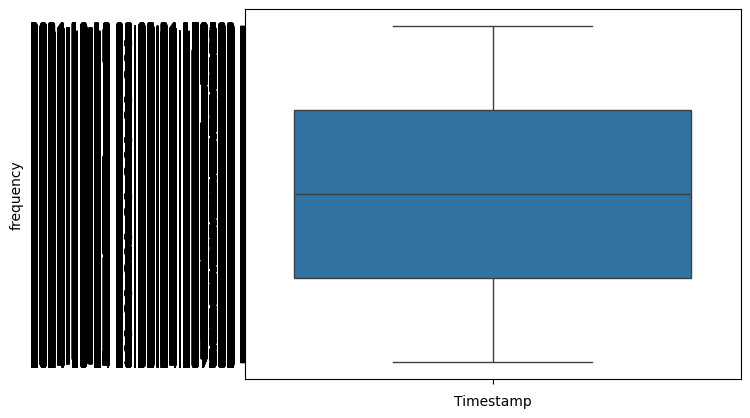

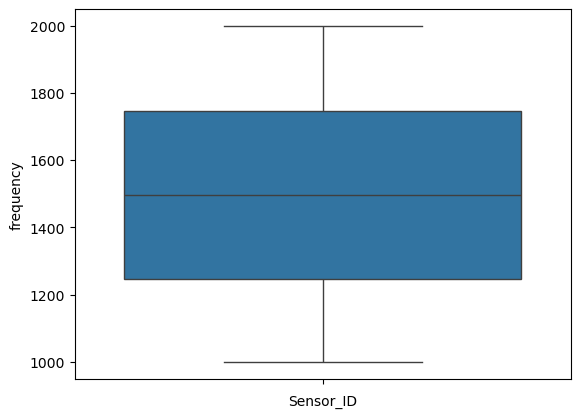

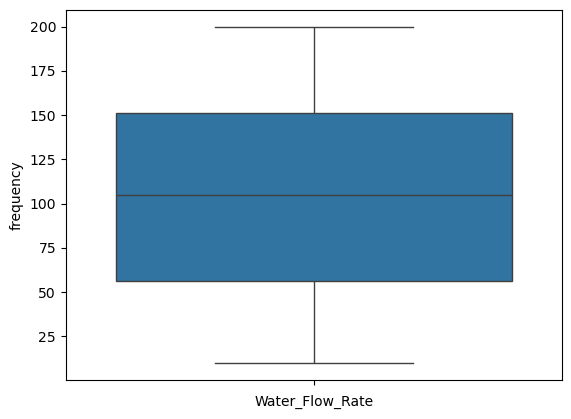

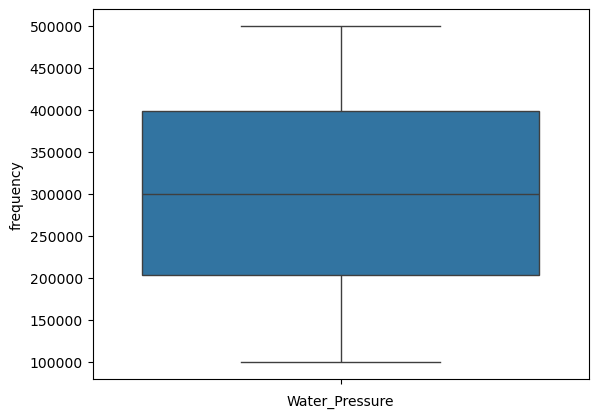

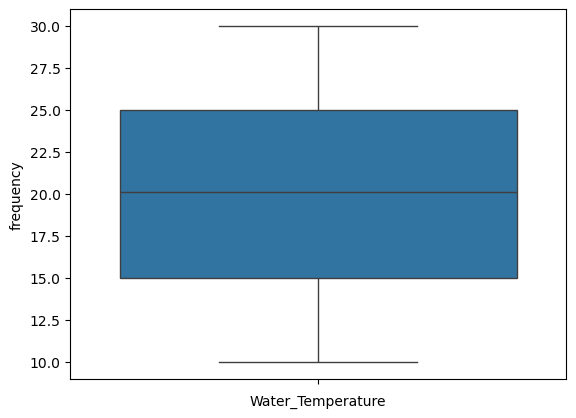

...

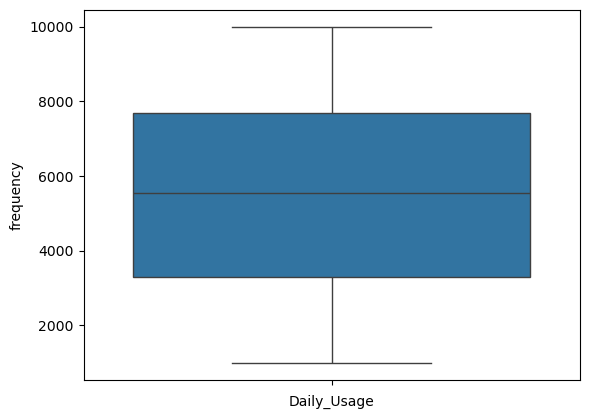

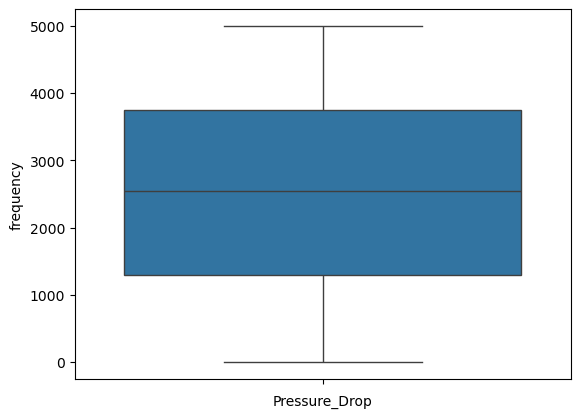

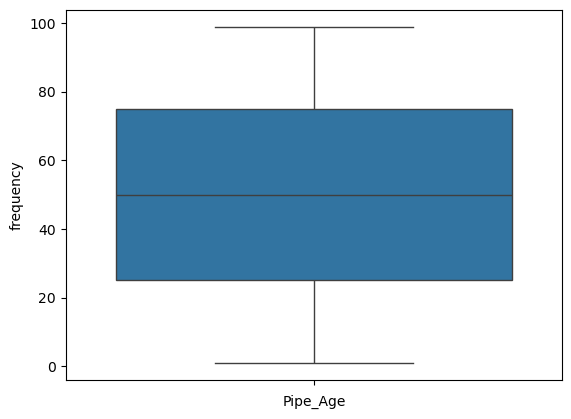

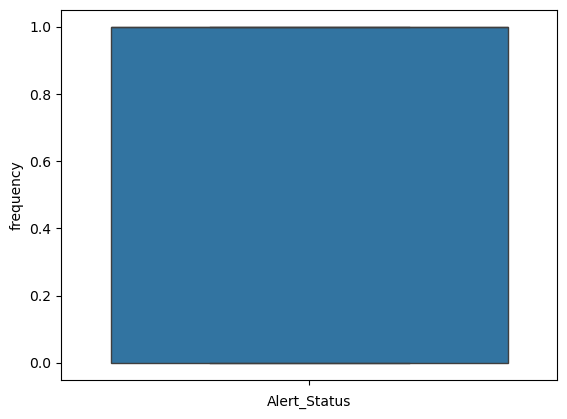

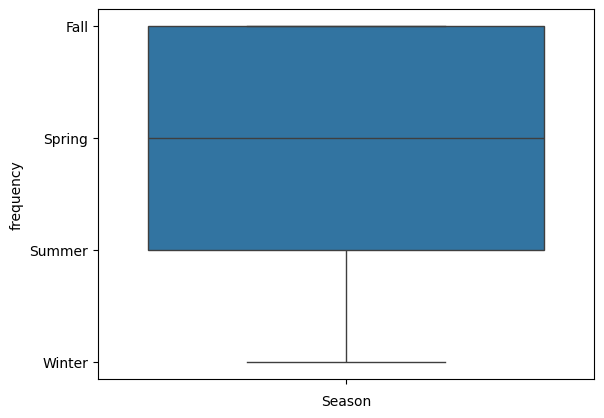

In [8]:
#Handling the Outliers
#outlier Analysis
col = df.columns
for i in col:
  if type(i)!='object':
    sns.boxplot(y=df[i])  # Using y= for vertical boxplots
    plt.xlabel(i)  # Set x-label for each subplot
    plt.ylabel('frequency')
    plt.show()

In [9]:
# Label Encoding the columns
l = ['Valve_Status','Pump_Status','Maintenance_Status','Alert_Status','Season']
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in l:
  df[i] = le.fit_transform(df[i])

In [10]:
df.head()

,Timestamp,Sensor_ID,Water_Flow_Rate,Water_Pressure,Water_Temperature,Water_Quality,Water_Level,Leak_Detection,Valve_Status,Pump_Status,Power_Consumption,Region_ID,Demand_Prediction,Maintenance_Status,Daily_Usage,Pressure_Drop,Pipe_Age,Alert_Status,Season
0,2024-10-18 08:06:24.179489,1936,123.012581,458742.877621,11.436859,8,2.629399,1,0,1,4.670474,60,7546.177642,0,6855.607313,2244.574084,88,1,0
1,2024-10-18 08:05:24.179500,1740,61.706821,212911.647084,27.884570,6,1.880211,0,0,0,3.454264,55,8269.850963,0,9446.864180,4637.182531,61,0,1
2,2024-10-18 08:04:24.179502,1416,59.250224,163731.693406,21.065049,3,4.425078,1,1,1,1.982614,25,8617.360369,0,8123.586568,4999.566667,11,1,0
3,2024-10-18 08:03:24.179503,1441,81.023858,457735.726387,22.790899,7,3.500476,0,0,0,0.458045,35,1867.914062,1,7722.627962,2133.616641,32,1,1
4,2024-10-18 08:02:24.179505,1163,67.688319,320732.978098,14.563713,6,2.437436,1,1,0,1.049182,20,644.600995,1,8390.072068,993.885190,23,1,2


In [11]:
df['Sensor_ID'].value_counts()
#Inference 1: 994 Sensors are used to collect the data

Sensor_ID
1400    14
1171    13
1749    13
1145    11
1501    11
        ..
1586     1
1779     1
1652     1
1839     1
1899     1
Name: count, Length: 994, dtype: int64

In [12]:
#Finding Average Water Flow Rate
df['Water_Flow_Rate'].mean()
#Inference 2: Average Water Flow Rate is 104 liters/Minute

104.73615973879387

In [13]:
#Maximum and Minimum water flow rate
print(df['Water_Flow_Rate'].max())
print(df['Water_Flow_Rate'].min())

199.94073540452425
10.052002047714875


In [66]:
print('Average Water Usage:',df['Daily_Usage'].mean())
print('Minimum Water Usage:',df['Water_Pressure'].min())
print('Maximum Water Usage:',df['Water_Pressure'].max())

Average Water Usage: 5533.783934313222
Minimum Water Usage: 100084.5505481272
Maximum Water Usage: 499933.1928159776


In [15]:
df['Water_Level'].value_counts()

Water_Level
2.629399    1
3.413089    1
2.488904    1
1.467571    1
3.320273    1
           ..
2.713823    1
3.320800    1
2.814505    1
1.352321    1
1.781075    1
Name: count, Length: 5000, dtype: int64

In [16]:
print('Average Pressure:',df['Water_Pressure'].mean())
print('Minimum Water Pressure:',df['Water_Pressure'].min())
print('Maximum Water Pressure:',df['Water_Pressure'].max())

Average Pressure: 300842.52463383926
Minimum Water Pressure: 100050.22268823178
Maximum Water Pressure: 499933.1928159776


Text(0.5, 1.0, 'Water Pressure Vs Water Flow Rate')

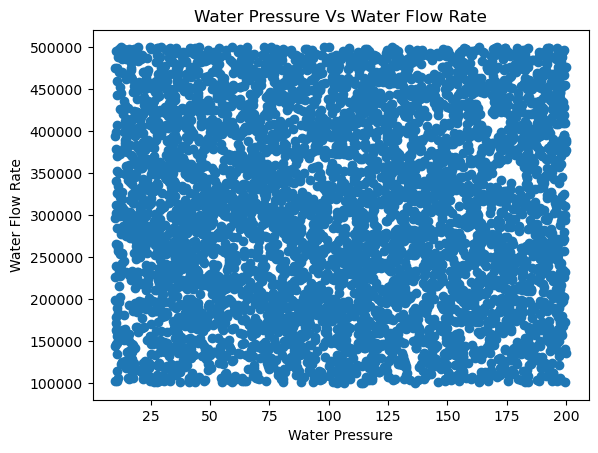

In [17]:
#Water Pressure Vs Water_Flow_Rate using lineplot
plt.scatter(df['Water_Flow_Rate'],df['Water_Pressure'])
plt.xlabel('Water Pressure')
plt.ylabel('Water Flow Rate')
plt.title('Water Pressure Vs Water Flow Rate')

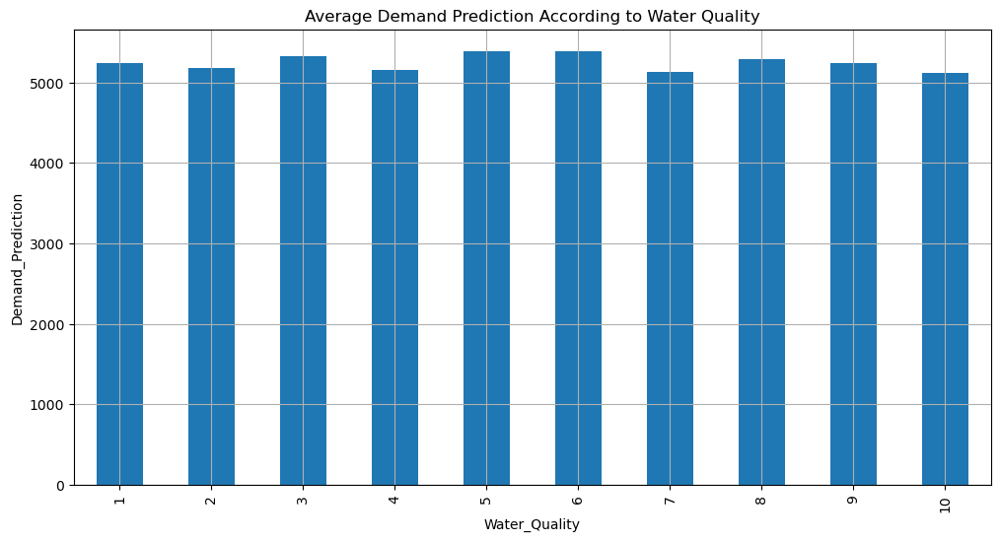

In [19]:
store_sales = df.groupby('Water_Quality')['Demand_Prediction'].mean()

# Plot
plt.figure(figsize=(12, 6))
store_sales.plot(kind='bar')
plt.title('Average Demand Prediction According to Water Quality')
plt.xlabel('Water_Quality')
plt.ylabel('Demand_Prediction')
plt.grid()
plt.show()

Inference: Demand for Water Quality 5 is High

In [21]:
df[df['Leak_Detection']==0]
#2000+ Pipes are Having Water Leakage Problem

,Timestamp,Sensor_ID,Water_Flow_Rate,Water_Pressure,Water_Temperature,Water_Quality,Water_Level,Leak_Detection,Valve_Status,Pump_Status,Power_Consumption,Region_ID,Demand_Prediction,Maintenance_Status,Daily_Usage,Pressure_Drop,Pipe_Age,Alert_Status,Season
1,2024-10-18 08:05:24.179500,1740,61.706821,212911.647084,27.884570,6,1.880211,0,0,0,3.454264,55,8269.850963,0,9446.864180,4637.182531,61,0,1
3,2024-10-18 08:03:24.179503,1441,81.023858,457735.726387,22.790899,7,3.500476,0,0,0,0.458045,35,1867.914062,1,7722.627962,2133.616641,32,1,1
7,2024-10-18 07:59:24.179510,1113,64.425635,102186.401817,26.757331,5,4.294436,0,0,0,4.604128,25,7158.693140,0,3308.344155,855.880866,87,0,1
9,2024-10-18 07:57:24.179514,1864,82.729540,301860.149515,24.764610,4,0.943810,0,1,1,4.855243,95,6756.368848,0,8628.468419,4054.017219,74,0,0
17,2024-10-18 07:49:24.179524,1466,127.500355,248620.056766,15.173109,7,1.000731,0,0,1,2.178152,33,2281.017744,1,1287.983497,3534.049586,53,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,2024-10-14 20:57:24.187572,1758,32.790702,488479.922608,10.024595,8,0.836175,0,0,1,1.513595,40,2708.048532,1,4429.051245,1931.396537,33,1,0
4990,2024-10-14 20:56:24.187577,1664,132.511568,120189.504186,25.751278,5,2.816335,0,0,1,4.914359,70,5947.360641,1,8120.063438,319.938175,36,1,2
4992,2024-10-14 20:54:24.187579,1945,40.091917,291293.217434,19.090008,6,4.073509,0,1,1,2.029179,96,7730.570534,1,3527.941730,2645.406810,76,1,2
4997,2024-10-14 20:49:24.187586,1322,150.795986,406852.689983,15.348981,3,2.280319,0,1,1,3.876747,72,8359.809411,1,6477.099991,2259.838228,50,1,0


In [22]:
df[df['Leak_Detection']==0].Water_Flow_Rate.mean()

103.83798446632619

In [23]:
df[df['Leak_Detection']==1].Water_Flow_Rate.mean()

105.61163231875051

Inference: Water Flow Rate is High if Leaks are not there when compared to Water Flow rate if leaks exist

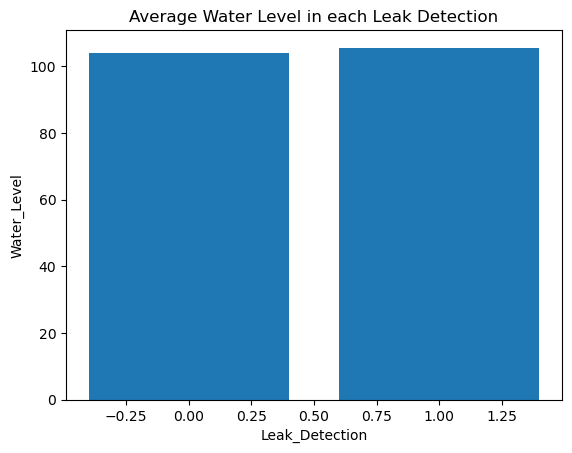

In [24]:
# Visualizing Water Flow rate According to Leak_Detection
l = [df[df['Leak_Detection']==0].Water_Flow_Rate.mean(),df[df['Leak_Detection']==1].Water_Flow_Rate.mean()]
plt.bar(range(len(l)),l)
plt.xlabel("Leak_Detection")
plt.ylabel("Water_Level")
plt.title("Average Water Level in each Leak Detection")
plt.show()

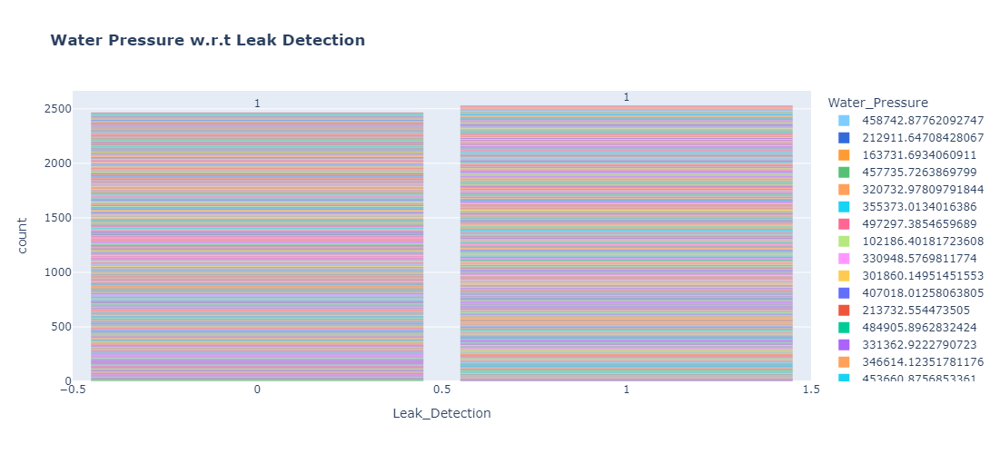

In [26]:
fig = px.histogram(df, x="Leak_Detection", color="Water_Pressure", title="<b>Water Pressure w.r.t Leak Detection</b>",text_auto=True)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.data[0].marker.color = ('#7fcdff')
fig.data[1].marker.color = ('#326ada')
fig.data[2].marker.color = ('#ff9b35')
fig.data[3].marker.color = ('#56c175')
fig.show()

In [27]:
df[df['Leak_Detection']==0].Water_Pressure.mean()

298117.20404952083

In [28]:
df[df['Leak_Detection']==1].Water_Pressure.mean()

303498.9587578905

<b>Inference: </b>Water Pressure Rate is High if there are no leaks.

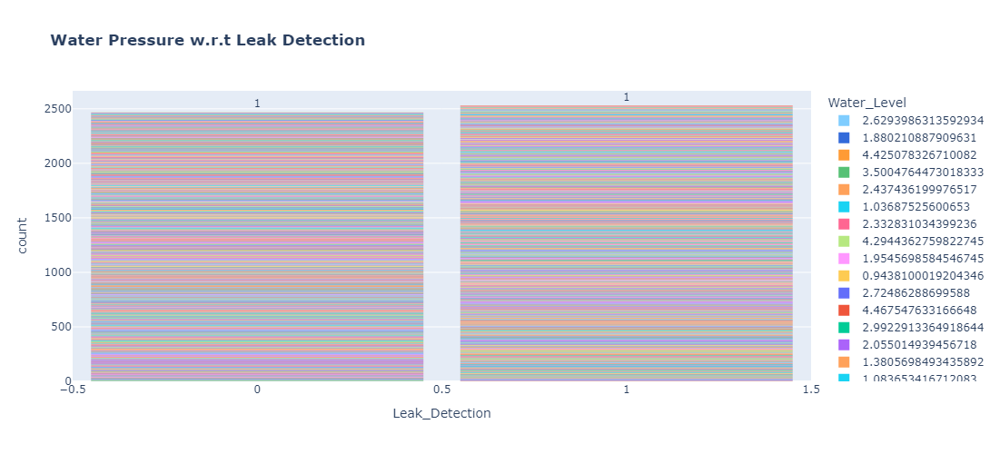

In [29]:
fig = px.histogram(df, x="Leak_Detection", color="Water_Level", title="<b>Water Pressure w.r.t Leak Detection</b>",text_auto=True)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.data[0].marker.color = ('#7fcdff')
fig.data[1].marker.color = ('#326ada')
fig.data[2].marker.color = ('#ff9b35')
fig.data[3].marker.color = ('#56c175')
fig.show()

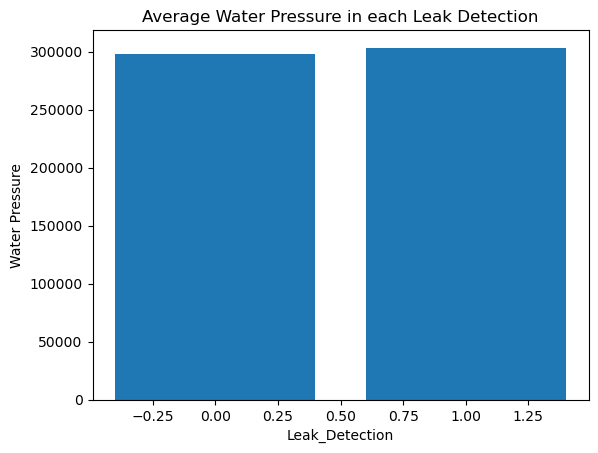

In [30]:
l = [df[df['Leak_Detection']==0].Water_Pressure.mean(),df[df['Leak_Detection']==1].Water_Pressure.mean()]
plt.bar(range(len(l)),l)
plt.xlabel("Leak_Detection")
plt.ylabel("Water Pressure")
plt.title("Average Water Pressure in each Leak Detection")
plt.show()

In [31]:
df[df['Leak_Detection']==0].Water_Level.mean()

2.7117478292288966

In [32]:
df[df['Leak_Detection']==1].Water_Level.mean()

2.7833847906642935

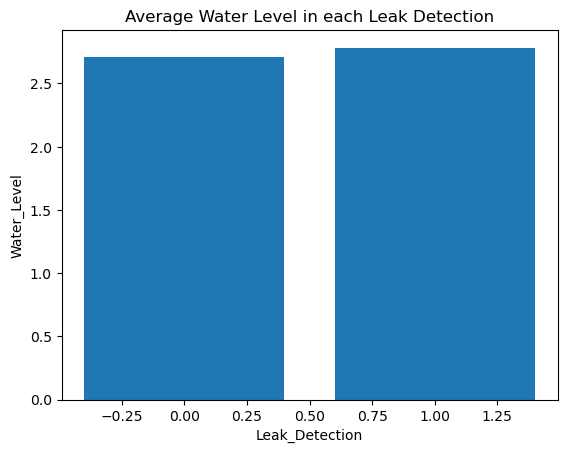

In [33]:
l = [df[df['Leak_Detection']==0].Water_Level.mean(),df[df['Leak_Detection']==1].Water_Level.mean()]
plt.bar(range(len(l)),l)
plt.xlabel("Leak_Detection")
plt.ylabel("Water_Level")
plt.title("Average Water Level in each Leak Detection")
plt.show()

<b>Inference: </b>Water Level is High if there are no leaks.

In [34]:
df['Region_ID'].value_counts()
#There are 99 Regions in the Dataset

Region_ID
20    68
74    67
92    66
80    65
70    62
      ..
10    39
9     38
16    35
59    33
97    29
Name: count, Length: 99, dtype: int64

In [35]:
df['Maintenance_Status'].value_counts()

Maintenance_Status
0    2554
1    2446
Name: count, dtype: int64

Inference: Almost 2500+ Pumps require Maintainance

In [36]:
df[(df['Maintenance_Status']==0) & (df['Leak_Detection']==0)]
# Use '&' instead of 'and' to combine boolean Series for element-wise comparison.
# Enclose individual conditions in parentheses for clarity and proper order of operations.

,Timestamp,Sensor_ID,Water_Flow_Rate,Water_Pressure,Water_Temperature,Water_Quality,Water_Level,Leak_Detection,Valve_Status,Pump_Status,Power_Consumption,Region_ID,Demand_Prediction,Maintenance_Status,Daily_Usage,Pressure_Drop,Pipe_Age,Alert_Status,Season
1,2024-10-18 08:05:24.179500,1740,61.706821,212911.647084,27.884570,6,1.880211,0,0,0,3.454264,55,8269.850963,0,9446.864180,4637.182531,61,0,1
7,2024-10-18 07:59:24.179510,1113,64.425635,102186.401817,26.757331,5,4.294436,0,0,0,4.604128,25,7158.693140,0,3308.344155,855.880866,87,0,1
9,2024-10-18 07:57:24.179514,1864,82.729540,301860.149515,24.764610,4,0.943810,0,1,1,4.855243,95,6756.368848,0,8628.468419,4054.017219,74,0,0
18,2024-10-18 07:48:24.179526,1029,141.734346,147903.565109,28.933207,10,3.895291,0,0,0,2.666346,26,5432.346848,0,5799.197818,683.899198,9,0,0
30,2024-10-18 07:36:24.179544,1790,118.683713,276827.132482,22.786617,3,3.534416,0,1,0,3.846423,61,9690.477922,0,7195.897935,1738.148259,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4957,2024-10-14 21:29:24.187529,1894,182.709543,412113.031323,21.348056,5,2.177546,0,0,1,1.380404,71,886.964622,0,9912.632424,1515.339422,82,1,1
4960,2024-10-14 21:26:24.187533,1920,78.304295,176430.753196,28.096811,5,4.074754,0,1,0,4.209232,80,6821.993509,0,7315.543535,3824.670421,80,0,1
4980,2024-10-14 21:06:24.187560,1575,114.838434,422032.921127,21.590196,4,4.813431,0,1,0,4.346911,81,843.218820,0,2868.566621,3778.448888,90,1,0
4985,2024-10-14 21:01:24.187567,1679,11.892208,496888.093203,16.170737,5,3.249981,0,0,1,2.357486,43,9542.821496,0,3140.799975,2718.266321,25,0,1


In [37]:
df[(df['Maintenance_Status']==0) & (df['Leak_Detection']==0)].shape

(1231, 19)

<b>Inference: </b>Almost 1200+ Pipes require Maintainance like Fixing the Leaks and Old Pipes usage

In [38]:
df[df['Pipe_Age']>50].shape

(2457, 19)

Inference: 2000+ Pipes Age is more than 50 years. average Life Span of a pipe is 50 years.

In [39]:
df[df['Pump_Status']==0].shape

(2480, 19)

Inference: 2400+ Pumps are Inactive and They Need Maintainace

In [40]:
print('Average Power Consumption is', df['Power_Consumption'].mean(),'kilowats')

Average Power Consumption is 2.563528979513824 kilowats


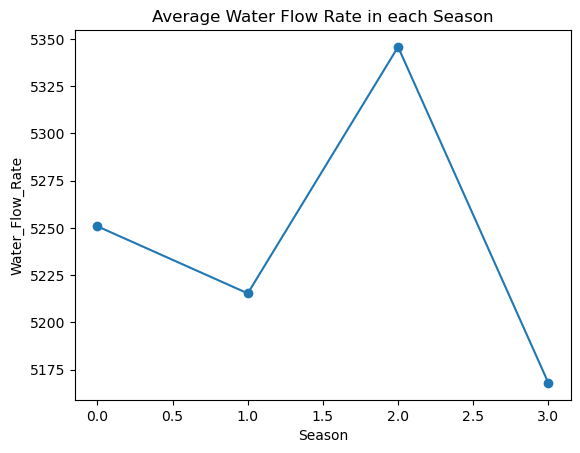

In [42]:
#Average Water Flow Rate in each season plot
l = [df[df['Season']==0].Demand_Prediction.mean(),df[df['Season']==1].Demand_Prediction.mean(),df[df['Season']==2].Demand_Prediction.mean(),df[df['Season']==3].Demand_Prediction.mean()]
plt.plot(l,marker='o')
plt.xlabel("Season")
plt.ylabel("Water_Flow_Rate")
plt.title("Average Water Flow Rate in each Season")
plt.show()

In [43]:
print('Demand Prediction in Fall Season is:',df[df['Season']==0].Demand_Prediction.mean()) #Autumn
print('Demand Prediction in Spring Season is:',df[df['Season']==1].Demand_Prediction.mean())
print('Demand Prediction in Summer Season is:',df[df['Season']==2].Demand_Prediction.mean())
print('Demand Prediction in Winter Season is:',df[df['Season']==3].Demand_Prediction.mean())

Demand Prediction in Fall Season is: 5250.820063348908
Demand Prediction in Spring Season is: 5215.353987850937
Demand Prediction in Summer Season is: 5345.736913642295
Demand Prediction in Winter Season is: 5167.9806321677925


<b>Inference:</b>The Demand for Water is More in Summer

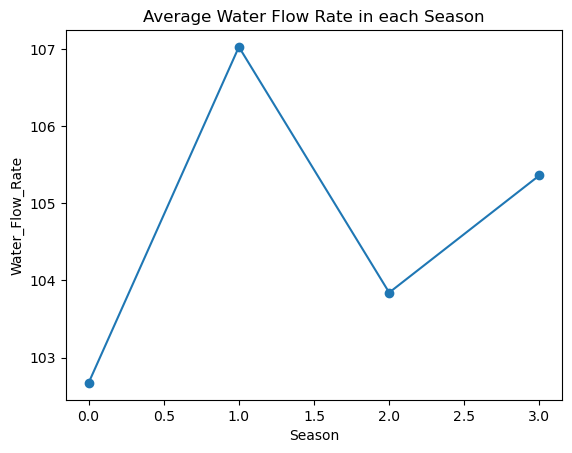

In [45]:
#Average Water Flow Rate in each season plot
l = [df[df['Season']==0].Water_Flow_Rate.mean(),df[df['Season']==1].Water_Flow_Rate.mean(),df[df['Season']==2].Water_Flow_Rate.mean(),df[df['Season']==3].Water_Flow_Rate.mean()]
plt.plot(l,marker='o')
plt.xlabel("Season")
plt.ylabel("Water_Flow_Rate")
plt.title("Average Water Flow Rate in each Season")
plt.show()

<b>Inference: </b>The Demand for Water is High in Summer

In [46]:
print('Demand Prediction in Fall Season is:',df[df['Season']==0].Water_Flow_Rate.mean()) #Autumn
print('Demand Prediction in Spring Season is:',df[df['Season']==1].Water_Flow_Rate.mean())
print('Demand Prediction in Summer Season is:',df[df['Season']==2].Water_Flow_Rate.mean())
print('Demand Prediction in Winter Season is:',df[df['Season']==3].Water_Flow_Rate.mean())

Demand Prediction in Fall Season is: 102.67176537387698
Demand Prediction in Spring Season is: 107.02558048308573
Demand Prediction in Summer Season is: 103.84233065489778
Demand Prediction in Winter Season is: 105.36204703642579


<b>Inference: </b>The Water Flow Rate is less in Summer. So, Water Scarcity takes place in Summer.

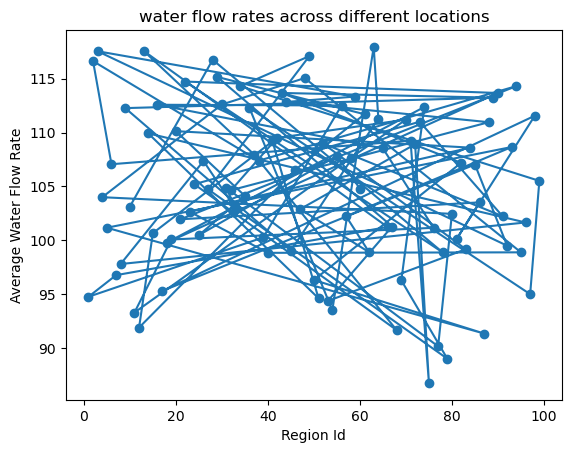

In [63]:
# water flow rates across different locations.

l = []
t = list(df['Region_ID'].unique())
avg = [df[df['Region_ID']==i].Water_Flow_Rate.mean() for i in t]
plt.plot(t,avg,marker='o')
plt.xlabel('Region Id')
plt.ylabel('Average Water Flow Rate')
plt.title('water flow rates across different locations')
plt.show()

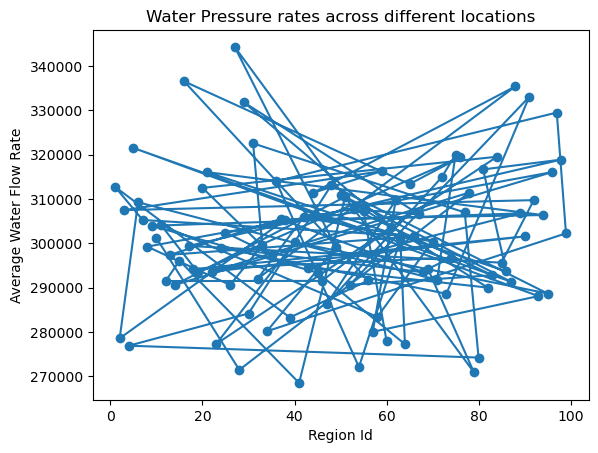

In [65]:
# water pressure rates across different locations.

l = []
t = list(df['Region_ID'].unique())
avg = [df[df['Region_ID']==i].Water_Pressure.mean() for i in t]
plt.plot(t,avg,marker='o')
plt.xlabel('Region Id')
plt.ylabel('Average Water Flow Rate')
plt.title('Water Pressure rates across different locations')
plt.show()

<h2>Inferences</h2>
<ol>
    			<li>994 Sensors are used to collect the data</li>
    			<li>Average Water Flow Rate is 104 liters</li>
    			<li>Maximum and Minimum WaterFlow Rates are : 199.94073540452425, 10.05200204771487 liters/minute 5<>/li
    			<li>Average Water Pressure: 300842.52463383926 Pascals</li>
    			<li>Minimum Water Pressure: 100050.2226882317 Pascals</li>        
			<li>Maximum Water Pressure: 499933.19281597 Pascals76</li>
    			<li>Demand for Water Quality 5 is High</li>
    			<li>2000+ Pipes are Having Water Leakage Problem</li>
    			<li>Water Flow Rate is High if Leaks are not there when compared to Water Flow rate if leaks exist</li>
    			<li>Water Pressure Rate is High if there are no leaks.</li>
    			<li>Water Level is High if there are no leaks.</li>
    			<li>Almost 2500+ Pumps require Maintainance</li>
    			<li> Almost 1200+ Pipes require Maintainance like Fixing the Leaks and Old Pipes usage</li>
    			<li>2000+ Pipes Age is more than 50 years. average Life Span of a pipe is 50 years.Usage of Old Pipes in Most of the Regions</li>
    			<li>2400+ Pumps are Inactive and They Need Maintainace</li>
    			<li>The Demand for Water is High in Summer</li>
    			<li>The Water Flow Rate is less in Summer. So, Water Scarcity exisn Summer.</li>i>>
		</ol>
>

## Anomaly Detection using Isolation Forest

<b>Anomaly Detection refers to identifying data points or patterns that deviate significantly from the expected behavior of a system or dataset. These anomalies (or outliers) can indicate unusual events, faults, or rare occurrences. In industrial processes, anomaly detection is critical for identifying system malfunctions, operational inefficiencies, or potential threats before they cause significant issues.

In [53]:

from sklearn.ensemble import IsolationForest

# Features for anomaly detection
features = ['Water_Flow_Rate', 'Water_Pressure', 'Water_Temperature', 'Water_Quality', 'Water_Level']
X = df[features]

# Fit Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df['Anomaly'] = iso_forest.fit_predict(X)

# Show anomalies
df = df[df['Anomaly'] != -1]
    

In [54]:
df

,Timestamp,Sensor_ID,Water_Flow_Rate,Water_Pressure,Water_Temperature,Water_Quality,Water_Level,Leak_Detection,Valve_Status,Pump_Status,Power_Consumption,Region_ID,Demand_Prediction,Maintenance_Status,Daily_Usage,Pressure_Drop,Pipe_Age,Alert_Status,Season,Anomaly
0,2024-10-18 08:06:24.179489,1936,123.012581,458742.877621,11.436859,8,2.629399,1,0,1,4.670474,60,7546.177642,0,6855.607313,2244.574084,88,1,0,1
1,2024-10-18 08:05:24.179500,1740,61.706821,212911.647084,27.884570,6,1.880211,0,0,0,3.454264,55,8269.850963,0,9446.864180,4637.182531,61,0,1,1
2,2024-10-18 08:04:24.179502,1416,59.250224,163731.693406,21.065049,3,4.425078,1,1,1,1.982614,25,8617.360369,0,8123.586568,4999.566667,11,1,0,1
3,2024-10-18 08:03:24.179503,1441,81.023858,457735.726387,22.790899,7,3.500476,0,0,0,0.458045,35,1867.914062,1,7722.627962,2133.616641,32,1,1,1
4,2024-10-18 08:02:24.179505,1163,67.688319,320732.978098,14.563713,6,2.437436,1,1,0,1.049182,20,644.600995,1,8390.072068,993.885190,23,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4993,2024-10-14 20:53:24.187581,1759,168.756434,442702.318549,10.971687,5,3.673640,1,1,0,1.780006,61,802.845884,0,2178.641541,3385.167185,8,1,1,1
4995,2024-10-14 20:51:24.187583,1294,180.910228,103536.061304,16.736808,5,4.154148,1,1,1,1.337174,60,6282.226019,1,3411.990932,2152.880792,36,0,3,1
4997,2024-10-14 20:49:24.187586,1322,150.795986,406852.689983,15.348981,3,2.280319,0,1,1,3.876747,72,8359.809411,1,6477.099991,2259.838228,50,1,0,1
4998,2024-10-14 20:48:24.187587,1744,133.151782,325735.766144,11.608285,6,3.835123,1,1,0,3.152715,99,3617.013962,1,6834.811504,4103.248816,52,0,1,1


# Forecasting the Water Demand

C:\Users\VENKATA ARJUN\AppData\Local\Temp\ipykernel_10524\3275193480.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\VENKATA ARJUN\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for ARMA and trend. All parameters except for variances will be set to zeros.



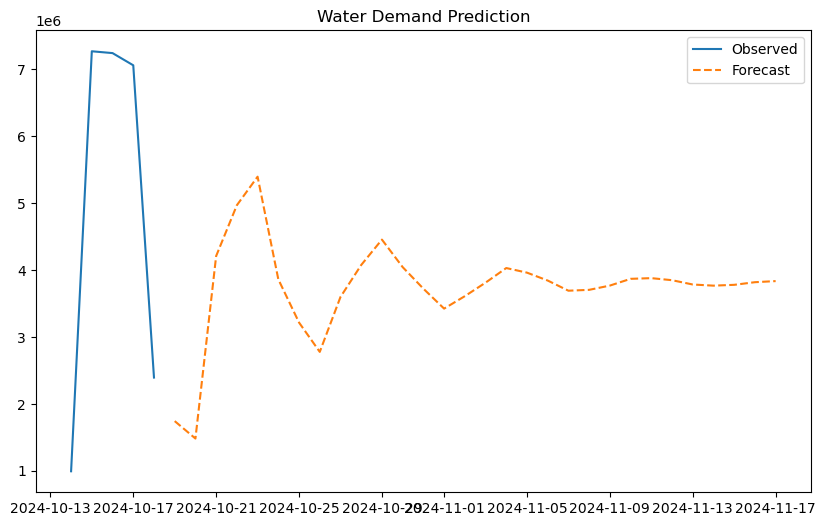

In [58]:
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Select water demand (daily usage) as the time series to forecast
df['Timestamp'] = pd.to_datetime(df['Timestamp'])
df.set_index('Timestamp', inplace=True)
daily_usage = df['Daily_Usage'].resample('D').sum()

# Fit ARIMA model
model = ARIMA(daily_usage, order=(5,1,0))
arima_result = model.fit()

# Forecast the next 30 days
forecast = arima_result.forecast(steps=30)

# Plot the forecast
plt.figure(figsize=(10, 6))
plt.plot(daily_usage, label='Observed')
plt.plot(forecast, label='Forecast', linestyle='--')
plt.title('Water Demand Prediction')
plt.legend()
plt.show()